<div align="center">
      <h1>Introduction to Neural Networks</h1>
      <hr>
</div>

## What You'll Learn 

In this assignment, we'll delve into the intricacies of neural networks, focusing on a two-hidden-layer architecture. Our hands-on approach will explore the operation of neural networks on the intriguing spiral dataset.

## Exploring Neural Networks

Through this practical exercise, we'll gain a deeper understanding of how neural networks work:

- We'll apply a neural network to the spiral dataset, allowing us to visualize its performance and grasp the inner workings of this powerful machine learning tool.
- We'll explore various activation functions within the context of this neural architecture, making connections between these functions and their impact on the data.

In [1]:
import matplotlib.pyplot as plt

%matplotlib inline
plt.rcParams['image.interpolation'] = 'nearest'

%load_ext autoreload
%autoreload 2

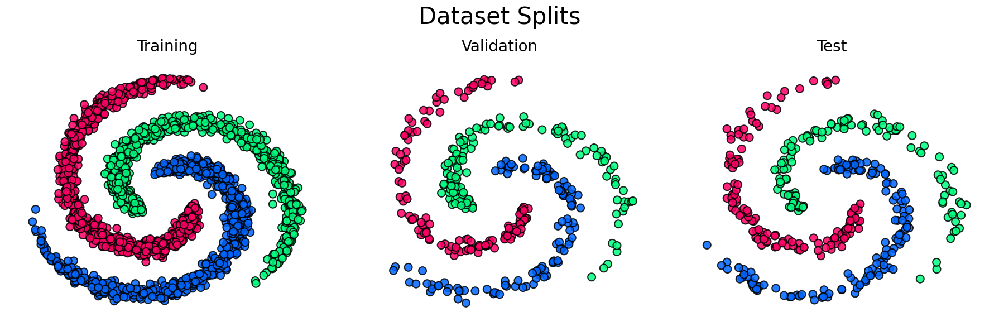

---------------- Training data ----------------
X_train shape: torch.Size([2250, 2]), y_train shape: torch.Size([2250])

---------------- Validation data ----------------
X_val shape: torch.Size([375, 2]), y_val shape: torch.Size([375])

---------------- Testing data ----------------
X_test shape: torch.Size([375, 2]), y_test shape: torch.Size([375])

---------------- Dataset info ----------------
Number of classes: 3
Number of features: 2
Number of samples in dataset: 3000
Number of samples in training set: 2250, which is 75.00% of the dataset
Number of samples in validation set: 375, which is 12.50% of the dataset
Number of samples in testing set: 375, which is 12.50% of the dataset


In [2]:
import torch
import numpy as np

from utils import Data2DVisualizer, dataset_stats

# Load the dataset, you already know the drill
dataset = np.load('data/datasets/spirals.npz')

X_train = torch.from_numpy(dataset['X_train']).float()
y_train = torch.from_numpy(dataset['y_train']).long()

X_val = torch.from_numpy(dataset['X_val']).float()
y_val = torch.from_numpy(dataset['y_val']).long()

X_test = torch.from_numpy(dataset['X_test']).float()
y_test = torch.from_numpy(dataset['y_test']).long()

vis = Data2DVisualizer((X_train, y_train), (X_val, y_val), (X_test, y_test))
vis.show_dataset()

num_features, num_classes, num_samples = dataset_stats(X_train, y_train, X_val, y_val, X_test, y_test, verbose=True)

## MLP Assignments

First read the materials provided

[MLP Materials](https://urob-ctu.github.io/docs/docs/classification/mlp.html)

and then procees to the assignments in the `assignments/mlp_classifier.py` file. After that return to this notebook and run the following cells to train and evaluate your model.

In [3]:
# Define the dimensions of the hidden layers
hidden_dim_1 = 100
hidden_dim_2 = 2

### ReLU Activation Function

Training: 100%|██████████| 10000/10000 [00:11<00:00, 877.28it/s]


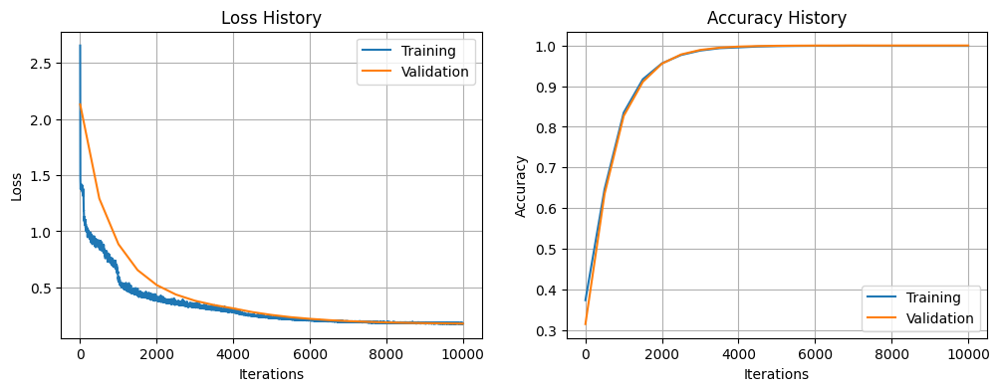

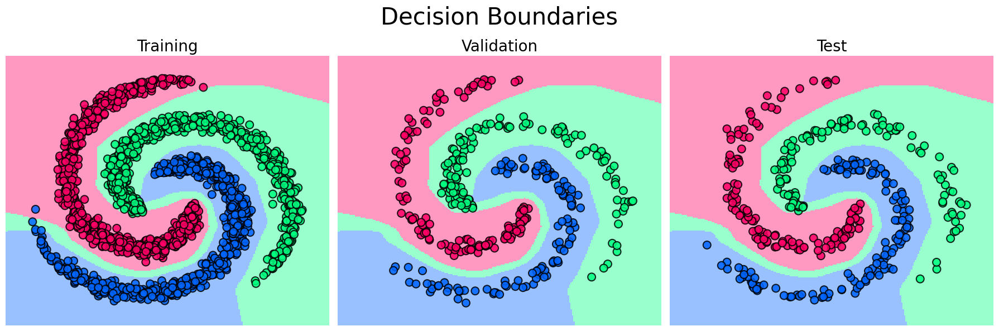

In [4]:
from utils import plot_training
from assignments_solution.mlp_classifier import MLPClassifier

np.random.seed(69)

# Train the MLP with ReLU activation function
mlp_relu = MLPClassifier(num_features, 
                         hidden_dim_1, 
                         hidden_dim_2, 
                         num_classes, 
                         reg=1e-3,
                         learning_rate=0.1, 
                         batch_size=200, 
                         num_iters=10000, 
                         verbose=True)
relu_loss_history, relu_acc_history = mlp_relu.train(X_train, y_train, X_val, y_val)

# Plot the training loss and accuracy and visualize the decision boundaries
plot_training(relu_loss_history, relu_acc_history, ema=True, alpha=0.5)
vis.show_decision_boundaries(mlp_relu, h=0.01)

In [5]:
vis.show_decision_functions(mlp_relu)

### Hyperbolic Tangent Activation Function

Training: 100%|██████████| 20000/20000 [00:23<00:00, 837.52it/s] 


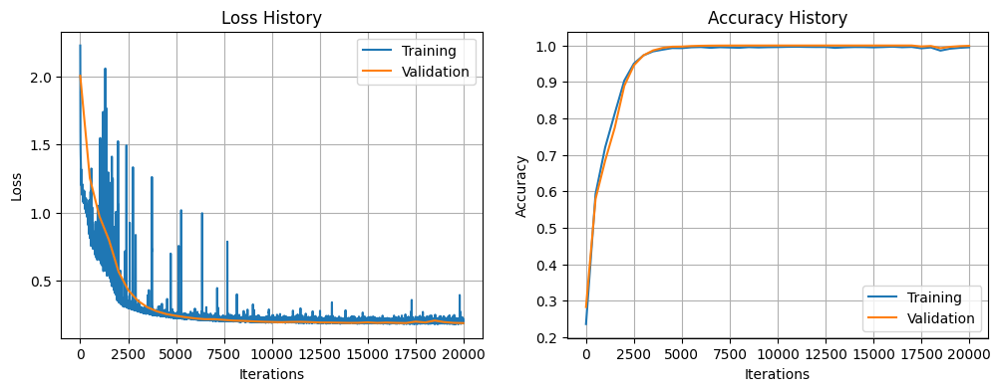

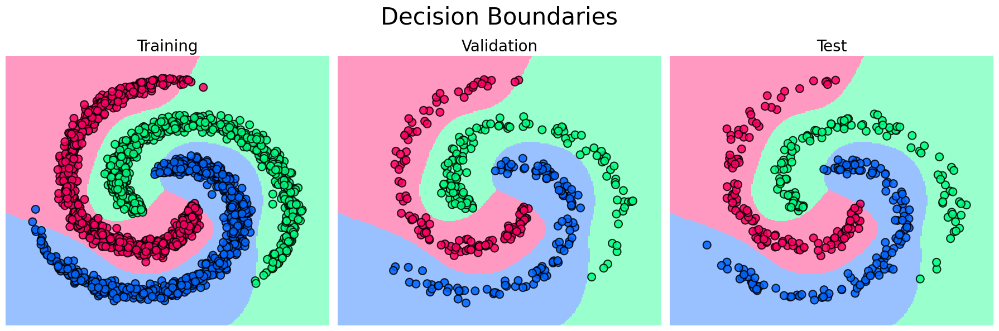

In [6]:
from utils import plot_training
from assignments_solution import MLPClassifier

np.random.seed(69)

# Train the MLP with Hyperbolic Tangent as an activation function
mlp_tanh = MLPClassifier(num_features, 
                         hidden_dim_1, 
                         hidden_dim_2, 
                         num_classes, 
                         reg=1e-3,
                         learning_rate=1e-1, 
                         batch_size=100, 
                         num_iters=20000, 
                         verbose=True, 
                         activation='tanh')
tanh_loss_history, tanh_acc_history = mlp_tanh.train(X_train, y_train, X_val, y_val)

# Plot the training loss and accuracy and visualize the decision boundaries
plot_training(tanh_loss_history, tanh_acc_history, ema=True, alpha=0.5)
vis.show_decision_boundaries(mlp_tanh, h=0.01)

In [7]:
vis.show_decision_functions(mlp_tanh)

### Sigmoid Activation Function

Training:   0%|          | 0/20000 [00:00<?, ?it/s]

Training: 100%|██████████| 20000/20000 [00:22<00:00, 905.93it/s] 


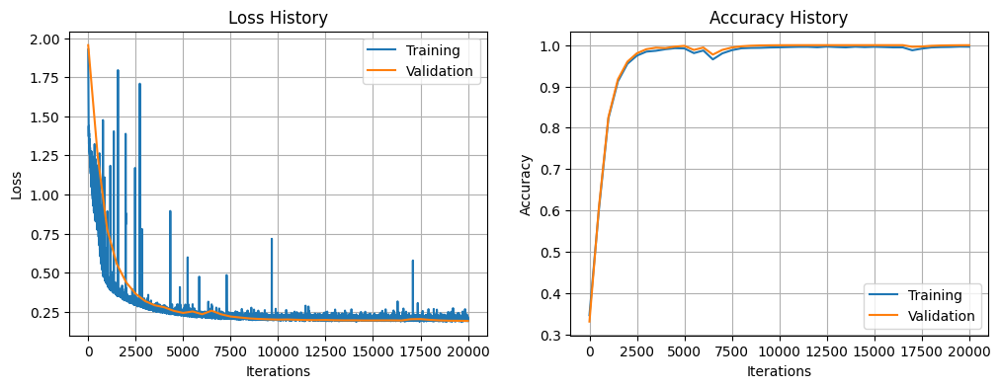

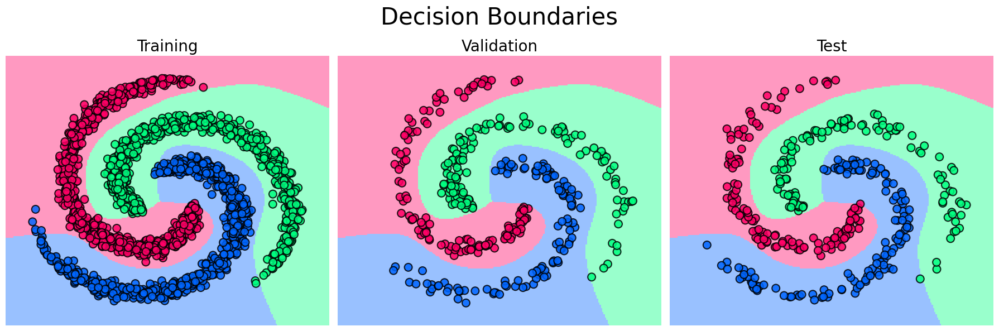

In [8]:
from utils import plot_training
from assignments_solution import MLPClassifier

np.random.seed(69)

# Train the MLP with Hyperbolic Tangent as an activation function
mlp_sigmoid = MLPClassifier(num_features, 
                         hidden_dim_1, 
                         hidden_dim_2, 
                         num_classes, 
                         reg=1e-3,
                         learning_rate=1e-1, 
                         batch_size=100, 
                         num_iters=20000, 
                         verbose=True, 
                         activation='tanh')

sigmoid_loss_history, sigmoid_acc_history = mlp_sigmoid.train(X_train, y_train, X_val, y_val)

# Plot the training loss and accuracy and visualize the decision boundaries
plot_training(sigmoid_loss_history, sigmoid_acc_history, ema=True, alpha=0.5)
vis.show_decision_boundaries(mlp_sigmoid, h=0.01)

In [9]:
vis.show_decision_functions(mlp_sigmoid)